In [1]:
# Load the required Python packages for scRNA-seq preprocessing, analysis, and integration
import scanpy as sc
import scvi
import bbknn
import scib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import anndata as ad
from anndata import AnnData
import seaborn as sns
from scipy.stats import median_abs_deviation
from scipy.sparse import csr_matrix, issparse
import celltypist
import anndata as ad
from celltypist import models
import scib_metrics
from scib_metrics.benchmark import Benchmarker
import scanorama
import pyliger
from harmony import harmonize
import bbknn



sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=150,
    dpi_save=700,
    vector_friendly=False,
    facecolor="white",
    frameon=False,
)

# R interface
from rpy2.robjects import pandas2ri
from rpy2.robjects import r
import rpy2.rinterface_lib.callbacks
import anndata2ri

pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
2024-12-16 15:02:05.190202: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-16 15:02:05.190500: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-16 15:02:05.196964: E external/

In [2]:
%%R
# R packages required for the workflow
library(Seurat)
library(SoupX)
library(Seurat)
library(scater)
library(scDblFinder)
library(BiocParallel)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/rpy2/ipython/rmagic.py:984: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  displaypub.publish_display_data(


Loading required package: SeuratObject
Loading required package: sp

Attaching package: 'SeuratObject'

The following object is masked from 'package:base':

    intersect



# Samples are pre-processed in an identical manner. We demonstrate the workflow using one of the samples (E10.5)

## Load the datasets

In [ ]:
e105_1 = sc.read_10x_h5(
    '/mnt/sdb/qdang/singlecell/PRJNA817268/veh01/cellranger/outs/filtered_feature_bc_matrix/',  # the directory with the '.h5' file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)   
e105_2 = sc.read_10x_h5(
    '/mnt/sdb/qdang/singlecell/PRJNA817268/veh02/cellranger/outs/filtered_feature_bc_matrix/',  # the directory with the `.h5` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True) 
e105_3 = sc.read_10x_h5(
    '/mnt/sdb/qdang/singlecell/PRJNA817268/veh03/cellranger/outs/filtered_feature_bc_matrix/',  # the directory with the `.h5` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True) 

In [30]:
e105_1

AnnData object with n_obs × n_vars = 15243 × 32285
    var: 'gene_ids', 'feature_types'

In [32]:
## Define specific populations for QC analysis
# mitochondrial genes
e105_1.var["mt"] = e105_1.var_names.str.startswith("mt-")
# ribosomal genes
e105_1.var["ribo"] = e105_1.var_names.str.startswith(("rps", "rpl"))
# hemoglobin genes.
e105_1.var["hb"] = e105_1.var_names.str.contains(("^hb[^(p)]"))

In [33]:
# Calculate QC metrics
sc.pp.calculate_qc_metrics(
    e105_1, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
e105_1

AnnData object with n_obs × n_vars = 15243 × 32285
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

... storing 'feature_types' as categorical


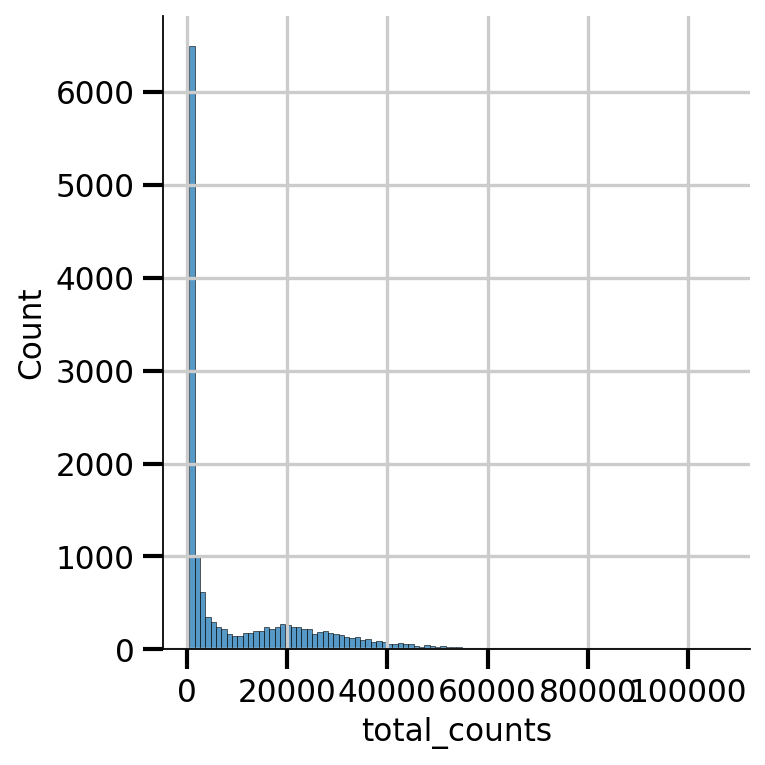

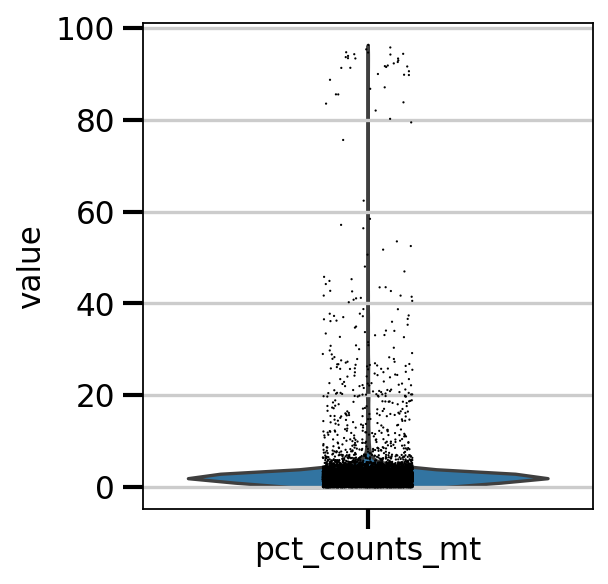

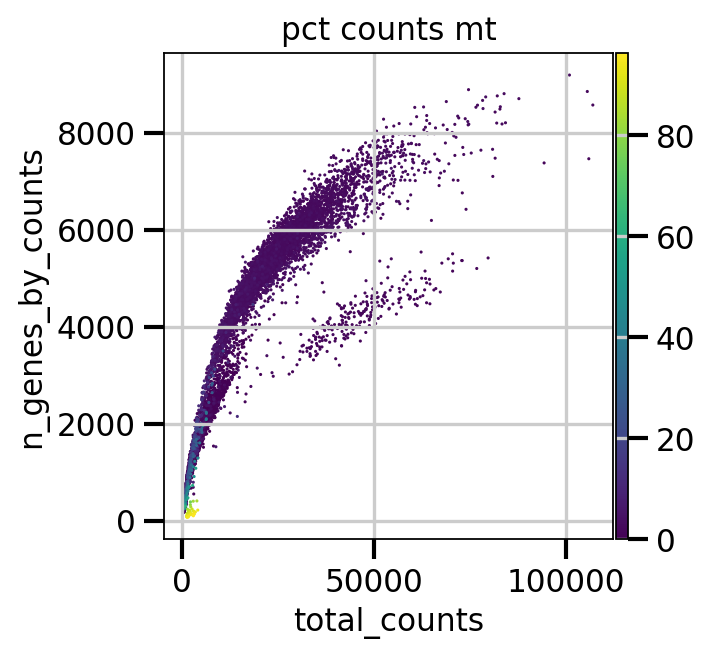

In [34]:
# Plot distribution of QC scores
p1 = sns.displot(e105_1.obs["total_counts"], bins=100, kde=False)
p2 = sc.pl.violin(e105_1, "pct_counts_mt")
p3 = sc.pl.scatter(e105_1, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [35]:
# Define a function to flag outliers based on median absolute deviation of certain QC metrics
def is_outlier(e105_1, metric: str, nmads: int):
    M = e105_1.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [36]:
# Flag outliers based on QC metrics such as the percentage of read counts in top 20 genes and total read counts
e105_1.obs["outlier"] = (
    is_outlier(e105_1, "log1p_total_counts", 5)
    | is_outlier(e105_1, "log1p_n_genes_by_counts", 5)
    | is_outlier(e105_1, "pct_counts_in_top_20_genes", 5)
)
e105_1.obs.outlier.value_counts()

False    14123
True      1120
Name: outlier, dtype: int64

In [41]:
# Flag outliers based on percentage of read counts being mitochondrial
e105_1.obs["mt_outlier"] = is_outlier(e105_1, "pct_counts_mt", 3) 
e105_1.obs.mt_outlier.value_counts()

False    14273
True       970
Name: mt_outlier, dtype: int64

In [42]:
# Actually filter low-quality cells 
print(f"Total number of cells: {e105_1.n_obs}")
e105_1 = e105_1[(~e105_1.obs.outlier) & (~e105_1.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {e105_1.n_obs}")

Total number of cells: 15243
Number of cells after filtering of low quality cells: 13344


## Perform ambient RNA correction

In [26]:
%%R
library(SoupX)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

In [43]:
e105_1_pp = e105_1.copy()
sc.pp.normalize_per_cell(e105_1_pp)
sc.pp.log1p(e105_1_pp)

In [44]:
# Perform preliminary normalisation and clustering, which may improve the performance of soupX
e105_1_pp = e105_1.copy()
sc.pp.normalize_per_cell(e105_1_pp)
sc.pp.log1p(e105_1_pp)
sc.pp.pca(e105_1_pp)
sc.pp.neighbors(e105_1_pp)
sc.tl.leiden(e105_1_pp, key_added="soupx_groups")

# Preprocess variables for SoupX
soupx_groups = e105_1_pp.obs["soupx_groups"]

In [47]:
# Save the cell names, gene names and the data matrix of the filtered cellranger output. Tranpose the matrix into a shape of features x barcodes
cells = e105_1.obs_names
genes = e105_1.var_names
data = e105_1.X.T

In [45]:
# Load the raw gene by cells matrix for contamination estimation
e105_1_raw = sc.read_10x_h5(
    filename = '/mnt/sdb/qdang/singlecell/PRJNA817268/veh01/cellranger/outs/raw_feature_bc_matrix.h5')  
e105_1_raw.var_names_make_unique()
data_tod = e105_1_raw.X.T

In [49]:
# Estimate contaminant fraction and correct gene expression, taking into account contaminent mRNA fraction
%%R -i data -i data_tod -i genes -i cells -i soupx_groups -o out 

# specify row and column names of data
rownames(data) = genes
colnames(data) = cells
# ensure correct sparse format for table of counts and table of droplets
data <- as(data, "sparseMatrix")
data_tod <- as(data_tod, "sparseMatrix")

# Generate SoupChannel Object for SoupX 
sc = SoupChannel(data_tod, data, calcSoupProfile = FALSE)

# Add extra meta data to the SoupChannel object
soupProf = data.frame(row.names = rownames(data), est = rowSums(data)/sum(data), counts = rowSums(data))
sc = setSoupProfile(sc, soupProf)
# Set cluster information in SoupChannel
sc = setClusters(sc, soupx_groups)

# Estimate contamination fraction
sc  = autoEstCont(sc, doPlot=FALSE)
# Infer corrected table of counts and rount to integer
out = adjustCounts(sc, roundToInt = TRUE)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/rpy2/ipython/rmagic.py:984: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  displaypub.publish_display_data(


3336 genes passed tf-idf cut-off and 401 soup quantile filter.  Taking the top 100.
Using 632 independent estimates of rho.
Estimated global rho of 0.01
Expanding counts from 20 clusters to 13344 cells.
In addition: Warning message:
In sparseMatrix(i = out@i[w] + 1, j = out@j[w] + 1, x = out@x[w],  :
  'giveCsparse' is deprecated; setting repr="T" for you


In [50]:
# Store the soupX-corrected counts and save it to the .X layer
e105_1.layers["counts"] = e105_1.X
e105_1.layers["soupX_counts"] = out.T
e105_1.X = e105_1.layers["soupX_counts"]

In [51]:
# Filter out genes that are not detected in at least 20 cells
print(f"Total number of genes: {e105_1.n_vars}")
sc.pp.filter_genes(e105_1, min_cells=20)
print(f"Number of genes after cell filter: {e105_1.n_vars}")

Total number of genes: 32285
Number of genes after cell filter: 18042


### Perform quality control on the second E10.5 sample

In [52]:
e105_2

AnnData object with n_obs × n_vars = 10928 × 32285
    var: 'gene_ids', 'feature_types'

In [54]:
# mitochondrial genes
e105_2.var["mt"] = e105_2.var_names.str.startswith("mt-")
# ribosomal genes
e105_2.var["ribo"] = e105_2.var_names.str.startswith(("rps", "rpl"))
# hemoglobin genes.
e105_2.var["hb"] = e105_2.var_names.str.contains(("^hb[^(p)]"))

In [55]:
sc.pp.calculate_qc_metrics(
    e105_2, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
e105_2

AnnData object with n_obs × n_vars = 10928 × 32285
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

... storing 'feature_types' as categorical


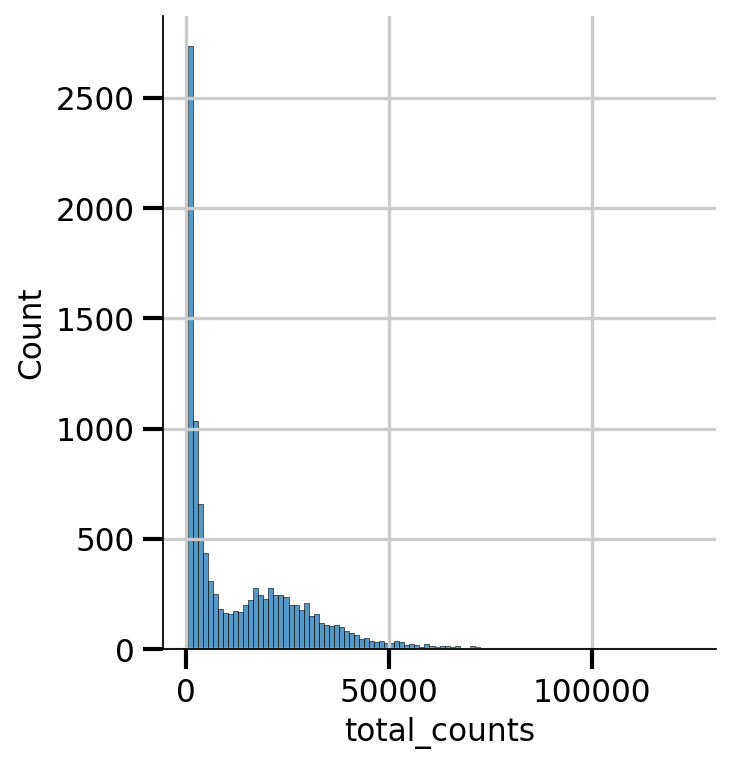

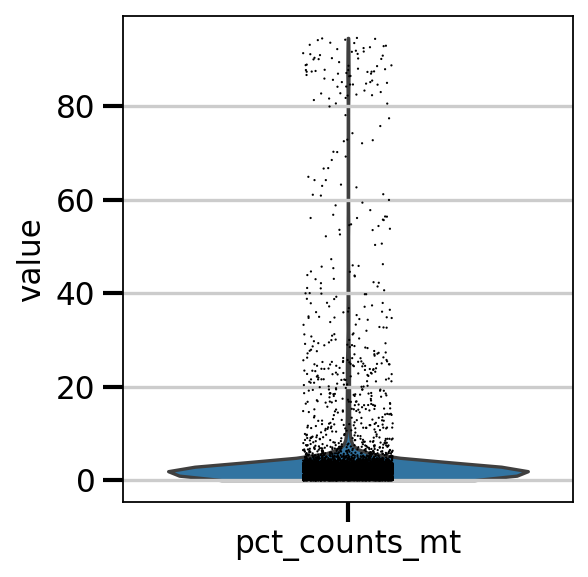

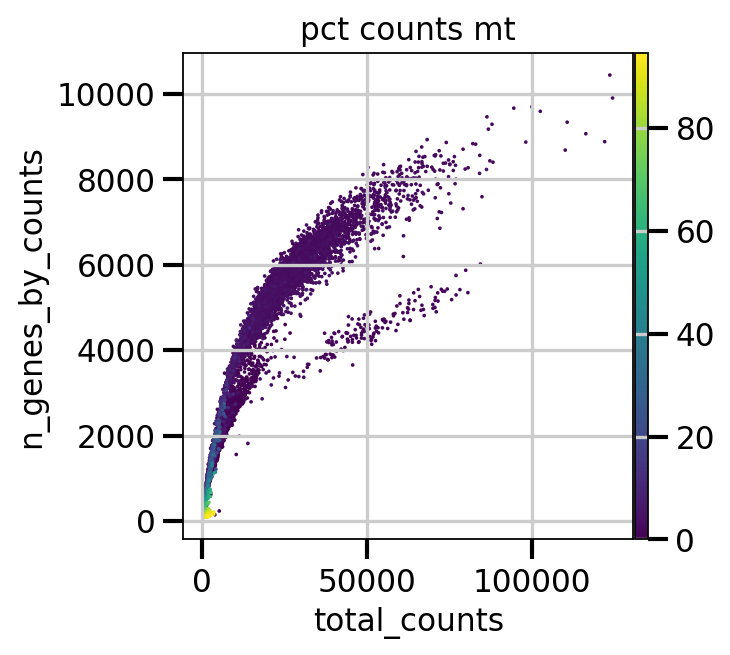

In [56]:
p1 = sns.displot(e105_2.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(e105_2, "pct_counts_mt")
p3 = sc.pl.scatter(e105_2, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [57]:
def is_outlier(e105_2, metric: str, nmads: int):
    M = e105_2.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [58]:
e105_2.obs["outlier"] = (
    is_outlier(e105_2, "log1p_total_counts", 5)
    | is_outlier(e105_2, "log1p_n_genes_by_counts", 5)
    | is_outlier(e105_2, "pct_counts_in_top_20_genes", 5)
)
e105_2.obs.outlier.value_counts()

False    10224
True       704
Name: outlier, dtype: int64

In [60]:
e105_2.obs["mt_outlier"] = is_outlier(e105_2, "pct_counts_mt", 3)  | (
    e105_2.obs["pct_counts_mt"] > 5
)
e105_2.obs.mt_outlier.value_counts()

False    10247
True       681
Name: mt_outlier, dtype: int64

In [61]:
print(f"Total number of cells: {e105_2.n_obs}")
e105_2 = e105_2[(~e105_2.obs.outlier) & (~e105_2.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {e105_2.n_obs}")

Total number of cells: 10928
Number of cells after filtering of low quality cells: 9843


In [63]:
e105_2_pp = e105_2.copy()
sc.pp.normalize_per_cell(e105_2_pp)
sc.pp.log1p(e105_2_pp)

In [64]:
sc.pp.pca(e105_2_pp)
sc.pp.neighbors(e105_2_pp)
sc.tl.leiden(e105_2_pp, key_added="soupx_groups")

# Preprocess variables for SoupX
soupx_groups = e105_2_pp.obs["soupx_groups"]

In [66]:
cells = e105_2.obs_names
genes = e105_2.var_names
data = e105_2.X.T

In [67]:
e105_2_raw = sc.read_10x_h5(
    filename = '/mnt/sdb/qdang/singlecell/PRJNA817268/veh02/cellranger/outs/raw_feature_bc_matrix.h5')  
e105_2_raw.var_names_make_unique()
data_tod = e105_2_raw.X.T

In [68]:
del e105_2_raw

In [69]:
%%R -i data -i data_tod -i genes -i cells -i soupx_groups -o out 

# specify row and column names of data
rownames(data) = genes
colnames(data) = cells
# ensure correct sparse format for table of counts and table of droplets
data <- as(data, "sparseMatrix")
data_tod <- as(data_tod, "sparseMatrix")

# Generate SoupChannel Object for SoupX 
sc = SoupChannel(data_tod, data, calcSoupProfile = FALSE)

# Add extra meta data to the SoupChannel object
soupProf = data.frame(row.names = rownames(data), est = rowSums(data)/sum(data), counts = rowSums(data))
sc = setSoupProfile(sc, soupProf)
# Set cluster information in SoupChannel
sc = setClusters(sc, soupx_groups)

# Estimate contamination fraction
sc  = autoEstCont(sc, doPlot=FALSE)
# Infer corrected table of counts and rount to integer
out = adjustCounts(sc, roundToInt = TRUE)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/rpy2/ipython/rmagic.py:984: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  displaypub.publish_display_data(


4166 genes passed tf-idf cut-off and 188 soup quantile filter.  Taking the top 100.
Using 827 independent estimates of rho.
Estimated global rho of 0.01
Expanding counts from 23 clusters to 9843 cells.
In addition: Warning message:
In sparseMatrix(i = out@i[w] + 1, j = out@j[w] + 1, x = out@x[w],  :
  'giveCsparse' is deprecated; setting repr="T" for you


In [70]:
e105_2.layers["counts"] = e105_2.X
e105_2.layers["soupX_counts"] = out.T
e105_2.X = e105_2.layers["soupX_counts"]

In [71]:
print(f"Total number of genes: {e105_2.n_vars}")

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(e105_2, min_cells=20)
print(f"Number of genes after cell filter: {e105_2.n_vars}")

Total number of genes: 32285
Number of genes after cell filter: 17960


### Perform QC on the third E10.5 embryonic heart replicate

In [72]:
e105_3

AnnData object with n_obs × n_vars = 7933 × 32285
    var: 'gene_ids', 'feature_types'

In [73]:
e105_3.var_names_make_unique()
e105_3

AnnData object with n_obs × n_vars = 7933 × 32285
    var: 'gene_ids', 'feature_types'

In [74]:
# mitochondrial genes
e105_3.var["mt"] = e105_3.var_names.str.startswith("mt-")
# ribosomal genes
e105_3.var["ribo"] = e105_3.var_names.str.startswith(("rps", "rpl"))
# hemoglobin genes.
e105_3.var["hb"] = e105_3.var_names.str.contains(("^hb[^(p)]"))

In [75]:
sc.pp.calculate_qc_metrics(
    e105_3, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
e105_3

AnnData object with n_obs × n_vars = 7933 × 32285
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

... storing 'feature_types' as categorical


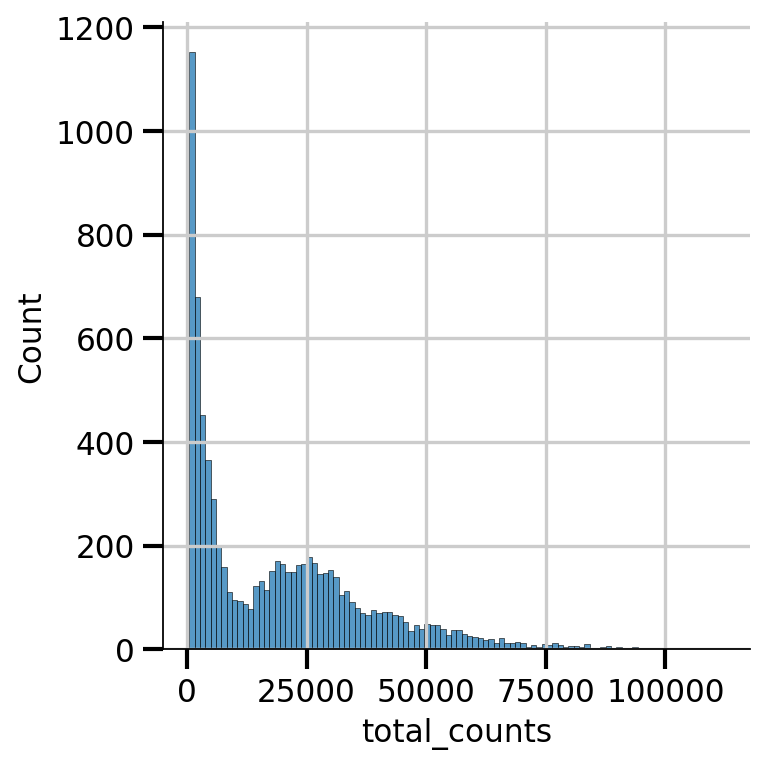

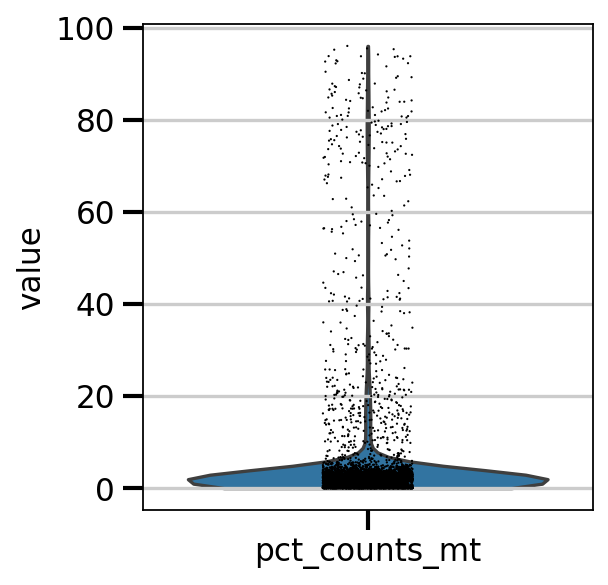

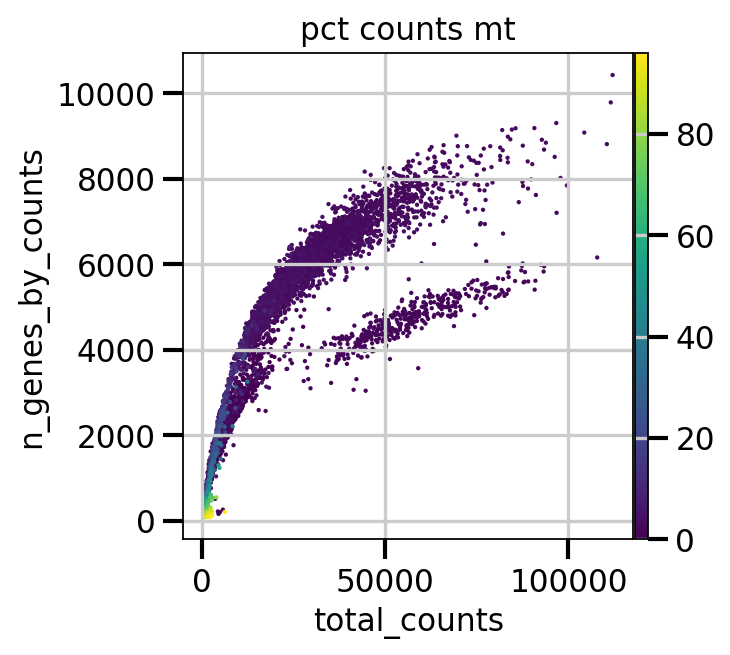

In [76]:
p1 = sns.displot(e105_3.obs["total_counts"], bins=100, kde=False)
p2 = sc.pl.violin(e105_3, "pct_counts_mt")
p3 = sc.pl.scatter(e105_3, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [77]:
def is_outlier(e105_3, metric: str, nmads: int):
    M = e105_3.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [78]:
e105_3.obs["outlier"] = (
    is_outlier(e105_3, "log1p_total_counts", 5)
    | is_outlier(e105_3, "log1p_n_genes_by_counts", 5)
    | is_outlier(e105_3, "pct_counts_in_top_20_genes", 5)
)
e105_3.obs.outlier.value_counts()

False    6946
True      987
Name: outlier, dtype: int64

In [81]:
e105_3.obs["mt_outlier"] = is_outlier(e105_3, "pct_counts_mt", 3)  | (
    e105_3.obs["pct_counts_mt"] > 8
)
e105_3.obs.mt_outlier.value_counts()

False    7281
True      652
Name: mt_outlier, dtype: int64

In [82]:
print(f"Total number of cells: {e105_3.n_obs}")
e105_3 = e105_3[(~e105_3.obs.outlier) & (~e105_3.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {e105_3.n_obs}")

Total number of cells: 7933
Number of cells after filtering of low quality cells: 6655


In [84]:
e105_3_pp = e105_3.copy()
sc.pp.normalize_per_cell(e105_3_pp)
sc.pp.log1p(e105_3_pp)

In [85]:
sc.pp.pca(e105_3_pp)
sc.pp.neighbors(e105_3_pp)
sc.tl.leiden(e105_3_pp, key_added="soupx_groups")

# Preprocess variables for SoupX
soupx_groups = e105_3_pp.obs["soupx_groups"]

In [86]:
del e105_3_pp

In [87]:
cells = e105_3.obs_names
genes = e105_3.var_names
data = e105_3.X.T

In [88]:
e105_3_raw = sc.read_10x_h5(
    filename = '/mnt/sdb/qdang/singlecell/PRJNA817268/veh03/cellranger/outs/raw_feature_bc_matrix.h5')  
e105_3_raw.var_names_make_unique()
data_tod = e105_3_raw.X.T

In [89]:
del e105_3_raw

In [90]:
%%R -i data -i data_tod -i genes -i cells -i soupx_groups -o out 

# specify row and column names of data
rownames(data) = genes
colnames(data) = cells
# ensure correct sparse format for table of counts and table of droplets
data <- as(data, "sparseMatrix")
data_tod <- as(data_tod, "sparseMatrix")

# Generate SoupChannel Object for SoupX 
sc = SoupChannel(data_tod, data, calcSoupProfile = FALSE)

# Add extra meta data to the SoupChannel object
soupProf = data.frame(row.names = rownames(data), est = rowSums(data)/sum(data), counts = rowSums(data))
sc = setSoupProfile(sc, soupProf)
# Set cluster information in SoupChannel
sc = setClusters(sc, soupx_groups)

# Estimate contamination fraction
sc  = autoEstCont(sc, doPlot=FALSE)
# Infer corrected table of counts and rount to integer
out = adjustCounts(sc, roundToInt = TRUE)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/rpy2/ipython/rmagic.py:984: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  displaypub.publish_display_data(


3273 genes passed tf-idf cut-off and 108 soup quantile filter.  Taking the top 100.
Using 829 independent estimates of rho.
Estimated global rho of 0.01
Expanding counts from 23 clusters to 6655 cells.
In addition: Warning message:
In sparseMatrix(i = out@i[w] + 1, j = out@j[w] + 1, x = out@x[w],  :
  'giveCsparse' is deprecated; setting repr="T" for you


In [91]:
e105_3.layers["counts"] = e105_3.X
e105_3.layers["soupX_counts"] = out.T
e105_3.X = e105_3.layers["soupX_counts"]

In [92]:
print(f"Total number of genes: {e105_3.n_vars}")

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(e105_3, min_cells=20)
print(f"Number of genes after cell filter: {e105_3.n_vars}")

Total number of genes: 32285
Number of genes after cell filter: 17759


In [93]:
e105_1

AnnData object with n_obs × n_vars = 13344 × 18042
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'soupX_counts'

In [94]:
e105_2

AnnData object with n_obs × n_vars = 9843 × 17960
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'soupX_counts'

In [95]:
e105_3

AnnData object with n_obs × n_vars = 6655 × 17759
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'soupX_counts'

# Now, we merge replicates together and perform doublet detection

In [96]:
# Concatenate the replicates together
e105 = {"E105_rep1": e105_1, "E105_rep2": e105_2, "E105_rep3": e105_3}
e105 = ad.concat(e105, label="replicates", join="outer")
e105

AnnData object with n_obs × n_vars = 29842 × 18431
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates'
    layers: 'counts', 'soupX_counts'

In [3]:
%%R
library(Seurat)
library(scater)
library(scDblFinder)
library(BiocParallel)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/rpy2/ipython/rmagic.py:984: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  displaypub.publish_display_data(


Attaching SeuratObject
Loading required package: SingleCellExperiment
Loading required package: SummarizedExperiment
Loading required package: MatrixGenerics
Loading required package: matrixStats

Attaching package: 'MatrixGenerics'

The following objects are masked from 'package:matrixStats':

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedi

In [4]:
# Transpose the cell by gene matrix 
data_mat = e105.X.T

In [5]:
%%R -i data_mat -o doublet_score -o doublet_class

set.seed(123)
sce = scDblFinder(
    SingleCellExperiment(
        list(counts=data_mat),
    ) 
)
doublet_score = sce$scDblFinder.score
doublet_class = sce$scDblFinder.class

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/rpy2/ipython/rmagic.py:984: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  displaypub.publish_display_data(


Creating ~23874 artificial doublets...
Dimensional reduction
Evaluating kNN...
Training model...
iter=0, 5558 cells excluded from training.
iter=1, 6634 cells excluded from training.
iter=2, 6917 cells excluded from training.
Threshold found:0.478
4993 (16.7%) doublets called
In addition: Warning message:
In scDblFinder(SingleCellExperiment(list(counts = data_mat), )) :
  You are trying to run scDblFinder on a very large number of cells. If these are from different captures, please specify this using the `samples` argument.TRUE


In [6]:
# Add scDblFinder score and classification to our Anndata object in obs. 
e105.obs["scDblFinder_score"] = doublet_score
e105.obs["scDblFinder_class"] = doublet_class
e105.obs.scDblFinder_class.value_counts()

singlet    24849
doublet     4993
Name: scDblFinder_class, dtype: int64

### The number of cells of the E10.5 data is larger than other datasets, which could create dataset imbalance during batch correction and integration. We randomly sub-sample the dataset to 10,000 cells. 

In [6]:
#Before subsampling
e105

AnnData object with n_obs × n_vars = 29842 × 18431
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates', 'scDblFinder_score', 'scDblFinder_class'
    layers: 'counts', 'soupX_counts'

In [7]:
sc.pp.subsample(e105,n_obs=10000)

In [8]:
#After subsampling
e105

AnnData object with n_obs × n_vars = 10000 × 18431
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates', 'scDblFinder_score', 'scDblFinder_class'
    layers: 'counts', 'soupX_counts'

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50


/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/anndata/_core/anndata.py:453: PendingDeprecationWarning: The dtype argument will be deprecated in anndata 0.10.0
  warnings.warn(


    finished (0:00:29)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:45)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


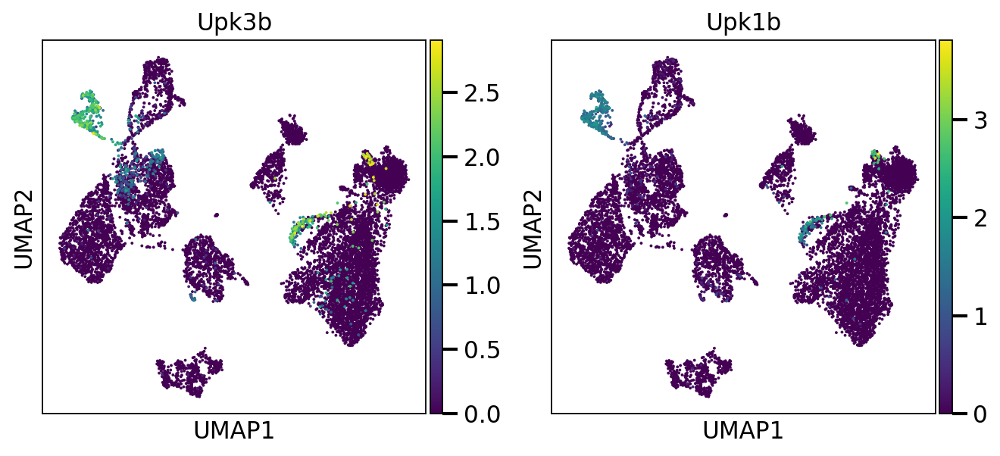

In [11]:
# The subsampling retains epicardial cells 
e105.X = e105.layers["soupX_counts"].copy()
sc.pp.normalize_total(e105)
sc.pp.log1p(e105)
e105.layers["logcounts"] = e105.X.copy()
sc.pp.neighbors(e105)
sc.tl.umap(e105)
sc.pl.umap(e105, color=['Upk3b', 'Upk1b'])

## Perform the concatenation of datasets

In [2]:
e105 = sc.read("/mnt/sdb/qdang/singlecell/PRJNA817268/e105_quality_control.h5ad")
e115 = sc.read("/mnt/sdb/qdang/singlecell/PRJNA797448/e115_quality_control.h5ad")
e125 = sc.read("/mnt/sdb/qdang/singlecell/MingLei/e125_quality_control.h5ad")
e135 = sc.read("/mnt/sdb/qdang/singlecell/epi/E135_analysis/e135_quality_control.h5ad")
e165 = sc.read("/mnt/sdb/qdang/singlecell/PRJNA647300/e165_quality_control.h5ad")
e175 = sc.read("/mnt/sdb/qdang/singlecell/epi/E175_analysis/e175_quality_control.h5ad")
p1 = sc.read("/mnt/sdb/qdang/singlecell/epi/integrated/alltimepoints/p1_merged_subsampled.h5ad")
p2 = sc.read("/mnt/sdb/qdang/singlecell/PRJNA972272/p2_quality_control.h5ad")
p4 = sc.read("/mnt/sdb/qdang/singlecell/PRJNA972272/p4_quality_control.h5ad")
p6 = sc.read("/mnt/sdb/qdang/singlecell/PRJNA972272/p6_quality_control.h5ad")

In [3]:
####Concatenate the datasets
adatas = {"E10.5": e105, "E11.5": e115, "E12.5": e125, "E13.5": e135, "E16.5": e165, "E17.5": e175, "P1": p1, "P2": p2, "P4": p4, "P6": p6}
adatas = ad.concat(adatas, label="batch", join="outer")
adatas

AnnData object with n_obs × n_vars = 72132 × 22402
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates', 'scDblFinder_score', 'scDblFinder_class', 'batch'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts', 'logcounts', 'soupX_counts'

In [2]:
adatas.obs_names_make_unique()
adatas.var_names_make_unique()
sc.pp.filter_cells(adatas, min_genes=200)
sc.pp.filter_genes(adatas, min_cells=3)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [3]:
adatas

AnnData object with n_obs × n_vars = 72120 × 22400
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates', 'scDblFinder_score', 'scDblFinder_class', 'batch', 'n_genes'
    var: 'n_cells'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts', 'logcounts', 'soupX_counts'

In [6]:
del adatas.layers['counts']
del adatas.layers['logcounts']
adatas.layers['soupX_counts'] = adatas.X.copy()
adatas

AnnData object with n_obs × n_vars = 72120 × 22400
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates', 'scDblFinder_score', 'scDblFinder_class', 'batch', 'n_genes'
    var: 'n_cells'
    obsm: 'X_pca', 'X_umap'
    layers: 'soupX_counts', 'counts'

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/seaborn/categorical.py:82: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


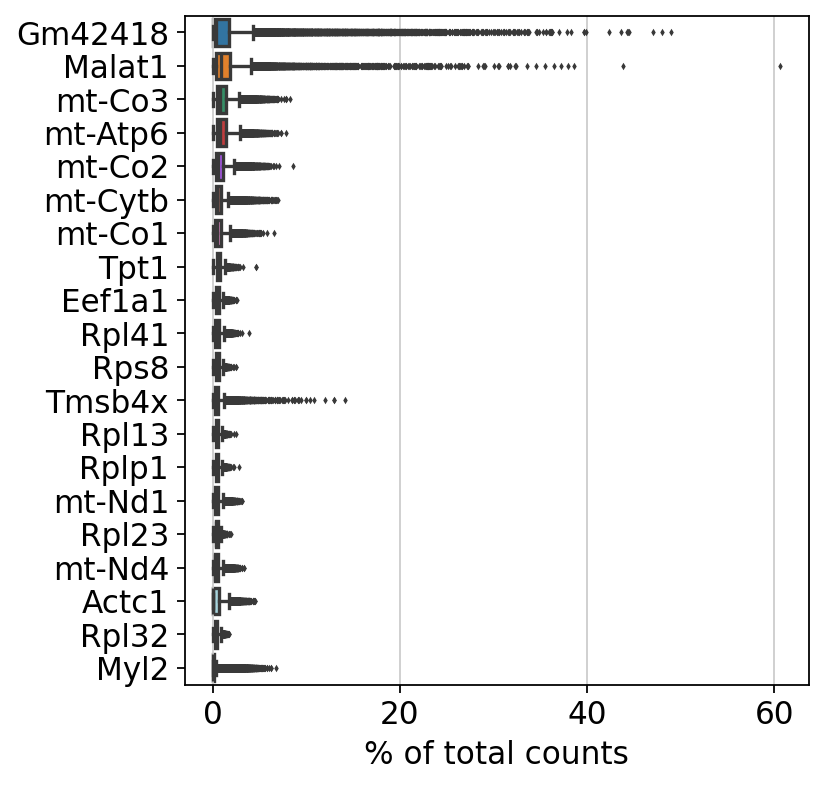

In [7]:
####Check if the concatenation process is successful
sc.pl.highest_expr_genes(adatas, n_top=20, )

### Below, we tested for three normalisation approaches to gauge their effectiveness in dimensionality reduction. We tested the log1p, scran, and pearson's residual approach. 

In [9]:
# First, normalisation and log1p transformation based on soupX-corrected counts
scales_counts = sc.pp.normalize_total(adatas, target_sum=None, inplace=False)
# log1p transform
adatas.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

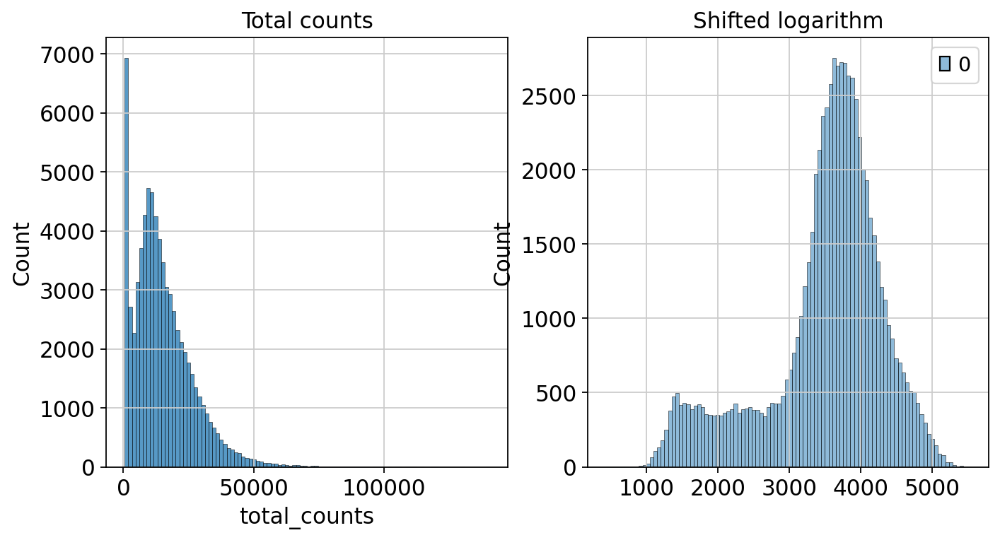

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adatas.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(adatas.layers["log1p_norm"].sum(1), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

In [10]:
# Preliminary clustering for differentiated Scran normalisation
adata_pp = adatas.copy()
sc.pp.normalize_total(adata_pp)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.leiden(adata_pp, key_added="groups")

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
2024-01-30 10:30:42.974828: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-01-30 10:30:43.002121: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-30 10:30:43.002143: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-30 10:30:43.003102: E external/local_xla/xla/s

In [12]:
# Add data_mat and our computed groups into our R environment.
data_mat = adata_pp.X.T
# convert to CSC if possible. See https://github.com/MarioniLab/scran/issues/70
if issparse(data_mat):
    if data_mat.nnz > 2**31 - 1:
        data_mat = data_mat.tocoo()
    else:
        data_mat = data_mat.tocsc()
ro.globalenv["data_mat"] = data_mat
ro.globalenv["input_groups"] = adata_pp.obs["groups"]

In [14]:
# Compute the size factors
%%R -o size_factors

size_factors = sizeFactors(
    computeSumFactors(
        SingleCellExperiment(
            list(counts=data_mat)), 
            clusters = input_groups,
            min.mean = 0.1,
            BPPARAM = MulticoreParam()
    )
)

In [15]:
size_factors

array([0.7551641 , 0.33221201, 0.72209503, ..., 1.37626362, 1.0939223 ,
       0.95932783])

In [16]:
# Save size_factors in .obs,  normalize the data, and subsequently apply a log1p transformation.
adatas.obs["size_factors"] = size_factors
scran = adatas.X / adatas.obs["size_factors"].values[:, None]
adatas.layers["scran_normalization"] = csr_matrix(sc.pp.log1p(scran))

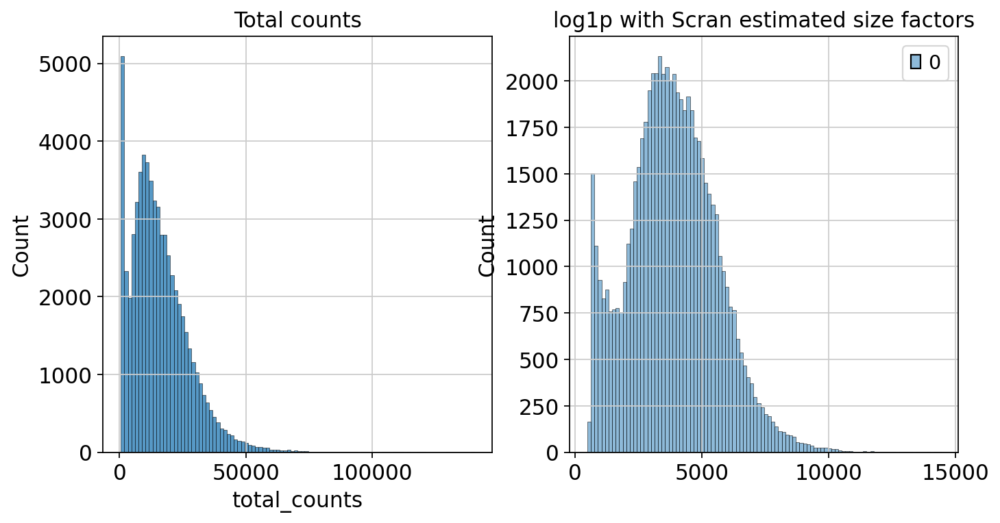

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adatas.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(
    adatas.layers["scran_normalization"].sum(1), bins=100, kde=False, ax=axes[1]
)
axes[1].set_title("log1p with Scran estimated size factors")
plt.show()

In [13]:
# Analytic pearson's residual approach
analytic_pearson = sc.experimental.pp.normalize_pearson_residuals(adatas, inplace=False)
adatas.layers["analytic_pearson_residuals"] = csr_matrix(analytic_pearson["X"])

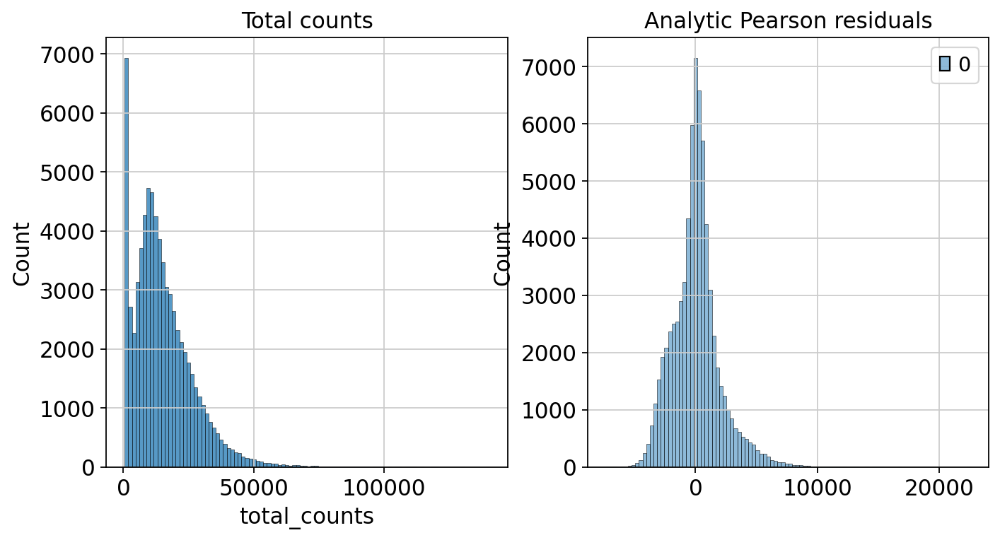

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adatas.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(
    adatas.layers["analytic_pearson_residuals"].sum(1), bins=100, kde=False, ax=axes[1]
)
axes[1].set_title("Analytic Pearson residuals")
plt.show()

# Next, let's do batch-aware feature selection

In [18]:
adatas.X = adatas.layers['log1p_norm'].copy()

In [19]:
batch_key = 'batch'

In [20]:
adatas.obs[batch_key].value_counts()

E12.5    10344
E10.5    10000
P6        9181
P2        8758
E13.5     8521
P4        6847
E17.5     6677
P1        6000
E11.5     3344
E16.5     2448
Name: batch, dtype: int64

0     6226
1     5110
2     2766
3     1861
4     1291
5      997
10     969
9      909
6      853
8      711
7      707
Name: highly_variable_nbatches, dtype: int64

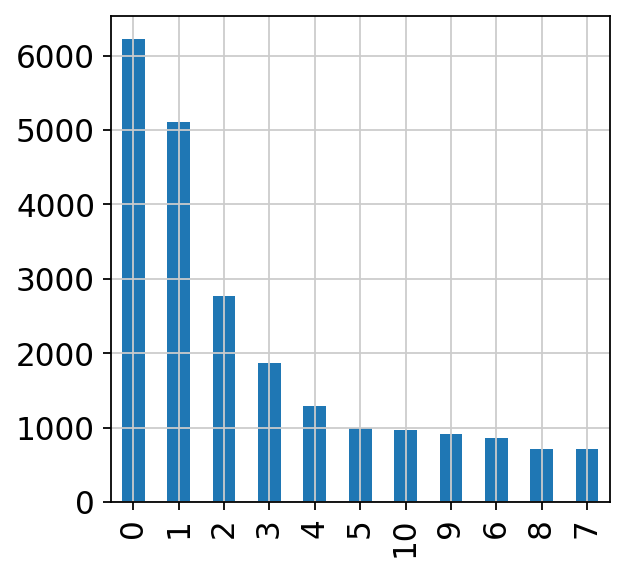

In [21]:
sc.pp.highly_variable_genes(
    adatas, n_top_genes=6000, flavor="cell_ranger", batch_key='batch'
)
n_batches = adatas.var["highly_variable_nbatches"].value_counts()
ax = n_batches.plot(kind="bar")
n_batches

# Let's perform dimensionality reduction with the integrated object

## We will test out the dimensionality reduction using all three normalization methods, start with log-transformation

2024-02-02 19:08:42.633339: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-02 19:08:43.211799: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-02 19:08:43.211907: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-02 19:08:43.300028: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-02 19:08:43.493229: I tensorflow/core/platform/cpu_feature_guar

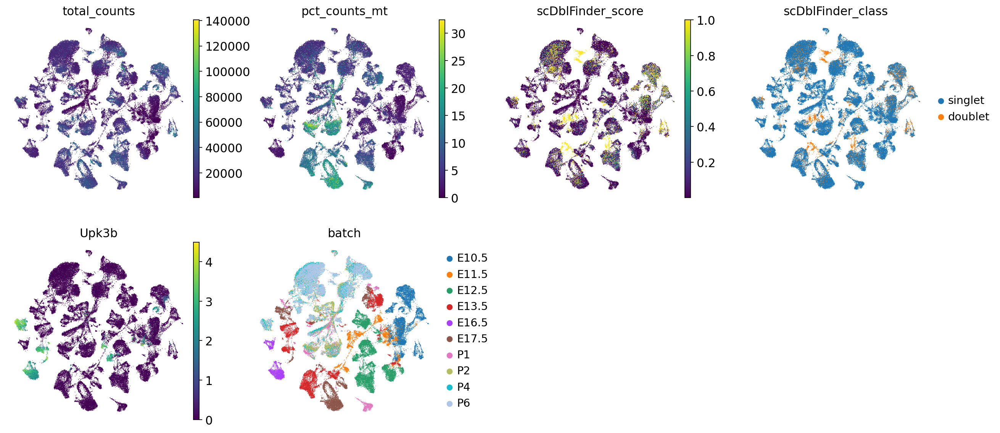

In [30]:
# Use log1p-transformed normalised counts, perform PCA, neighbotrhood graph detection, and UMAP
adatas.X = adatas.layers["log1p_norm"].copy()
sc.pp.pca(adatas, svd_solver="arpack", use_highly_variable=True)
sc.pp.neighbors(adatas)
sc.tl.umap(adatas)
sc.pl.umap(
    adatas,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class", "Upk3b", "batch"],
)

## Next, let's try scran-normalized count to see if it improves the dimensionality reduction process. 

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


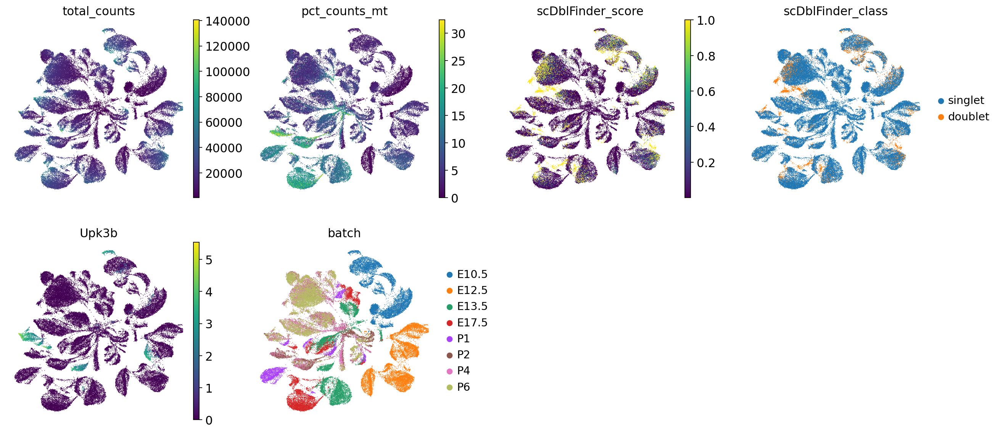

In [27]:
adatas.X = adatas.layers["scran_normalization"].copy()
sc.pp.pca(adatas, svd_solver="arpack", use_highly_variable=True)
sc.pp.neighbors(adatas)
sc.tl.umap(adatas)
sc.pl.umap(
    adatas,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class", "Upk3b", "batch"],
)

## Lastly, pearson residual for the rescue

2024-01-30 12:14:04.872316: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-01-30 12:14:04.901899: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-30 12:14:04.901920: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-30 12:14:04.902883: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-30 12:14:04.907805: I tensorflow/core/platform/cpu_feature_guar

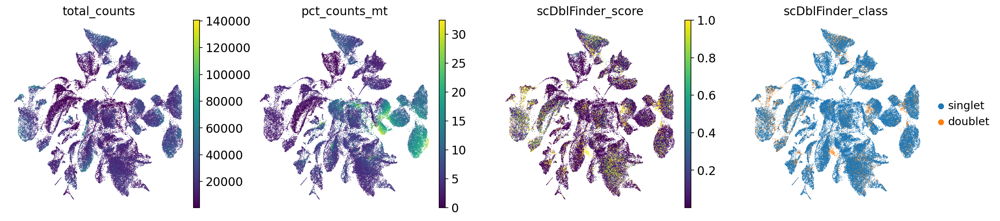

In [6]:
adatas.X = adatas.layers["analytic_pearson_residuals"].copy()
sc.pp.pca(adatas, svd_solver="arpack", use_highly_variable=True)
sc.pp.neighbors(adatas)
sc.tl.umap(adatas)
sc.pl.umap(
    adatas,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class"],
)

## From visual inspection, it looks as though scran produces clear clustering (comparable to log1p transformation), and was able to group doublets into clusters the best, and was able to give a reasonable depiction of epicardial clusters (cluster 17.5, P1, and postnatal stages being closer together. Scran also seems to be able to somewhat correct the batch effect. I'm selecting log1p since the method is recommended by the literature, while batch correction will be a major focus of the pipeline later on. 

In [14]:
adatas.X = adatas.layers["log1p_norm"].copy()
sc.pp.pca(adatas, svd_solver="arpack", use_highly_variable=True)
sc.pp.neighbors(adatas, n_pcs=30)
sc.tl.umap(adatas)
# Perform leiden clustering
sc.tl.leiden(adatas, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(adatas, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adatas, key_added="leiden_res1", resolution=1.0)
sc.tl.leiden(adatas, key_added="leiden_res2", resolution=2)

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


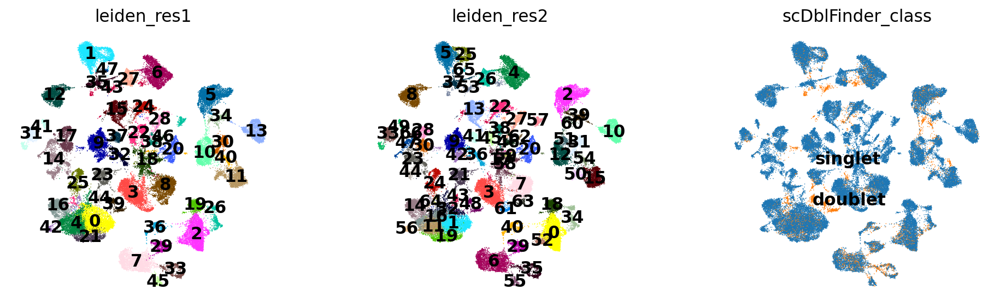

In [41]:
# Plot leiden clustering and doublet classification
sc.pl.umap(
    adatas,
    color=["leiden_res1", "leiden_res2", "scDblFinder_class"],
    legend_loc="on data",
)

## Do some preliminary annotation with Celltypist

2024-10-08 12:41:04.077168: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-10-08 12:41:04.164551: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-08 12:41:04.164586: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-08 12:41:04.165945: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-08 12:41:04.174548: I tensorflow/core/platform/cpu_feature_guar

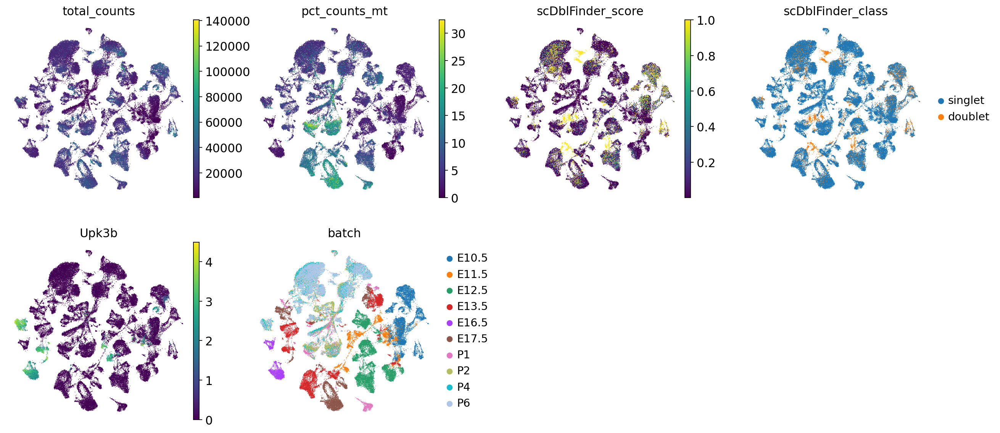

In [8]:
sc.pp.pca(adatas, svd_solver="arpack", use_highly_variable=True)
sc.pp.neighbors(adatas)
sc.tl.umap(adatas)
sc.pl.umap(
    adatas,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class", "Upk3b", "batch"],
)

In [10]:
#For the query, counts are normalized to 10,000 counts per cell, then log1p-transformed
adata_celltypist = adatas.copy()  # make a copy of our adata
adata_celltypist.X = adatas.layers["counts"]  # set adata.X to raw counts
sc.pp.normalize_per_cell(
    adata_celltypist, counts_per_cell_after=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
adata_celltypist.X = adata_celltypist.X.toarray()

In [12]:
#Must run clustering before this step!!!
import celltypist
from celltypist import models
predictions2 = celltypist.annotate(adata_celltypist, model = '/mnt/sdb/qdang/singlecell/epi/model_from_PRJNA795900.pkl', majority_voting = True)

🔬 Input data has 72120 cells and 22400 genes
🔗 Matching reference genes in the model
🧬 1965 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [13]:
# Convert celltypist output into an anndata object
predictions_adata2 = predictions2.to_adata()

In [14]:
# Transfer annotation label and confidence scores to the newly created anndata object
adatas.obs["celltypist_cell_label_PRJNA795900"] = predictions_adata2.obs.loc[
    adatas.obs.index, "majority_voting"
]
adatas.obs["celltypist_conf_score_PRJNA795900"] = predictions_adata2.obs.loc[
    adatas.obs.index, "conf_score"
]

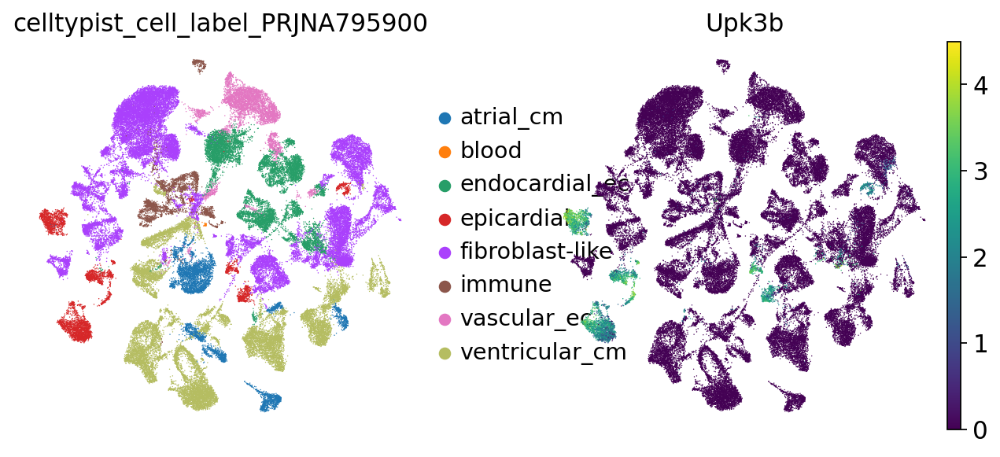

In [15]:
# We can see that the atuomated annotation correctly identifies epicardial cells. 
sc.pl.umap(
    adatas,
    color=["celltypist_cell_label_PRJNA795900",  "Upk3b"],
    frameon=False,
    sort_order=False,
    wspace=0.2,
)

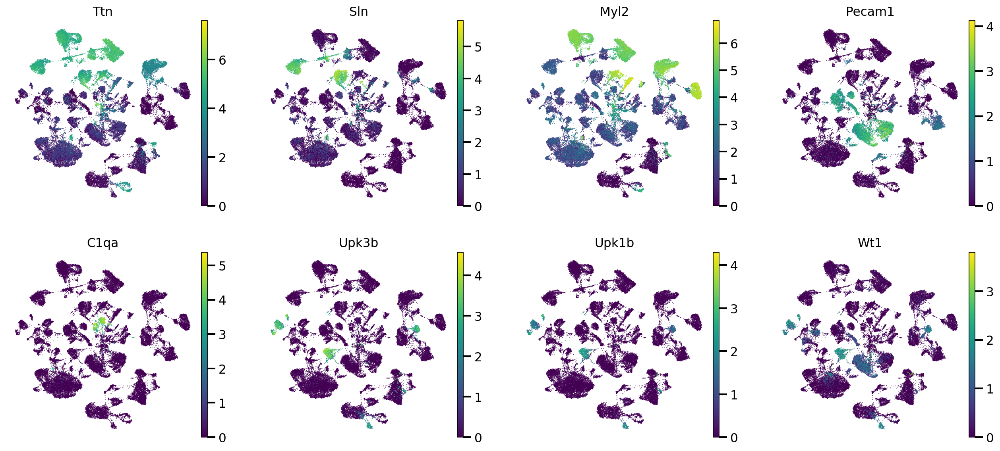

In [20]:
# Automated automation generally performs well for other cardialc cell types 
sc.pl.umap(adatas, color=['Ttn', 'Sln', 'Myl2', 'Pecam1','C1qa', 'Upk3b', 'Upk1b', 'Wt1'])

In [10]:
# For clarity, check the UMAP embedding for epicardial cells in the unintegrated dataset. This will verify the need for batch correction and integration. 
epi=adatas[adatas.obs['celltypist_cell_label_PRJNA795900'].isin(['epicardial'])]
epi

View of AnnData object with n_obs × n_vars = 4672 × 22400
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates', 'scDblFinder_score', 'scDblFinder_class', 'batch', 'n_genes', 'celltypist_cell_label_PRJNA795900', 'celltypist_conf_score_PRJNA795900'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'celltypist_cell_label_PRJNA795900_colors', 'batch_colors', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'analytic_pearson_residuals', 'counts', 'log1p_norm', 'soupX_counts'
    obsp: 'distances', 'connectivities'

/home/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


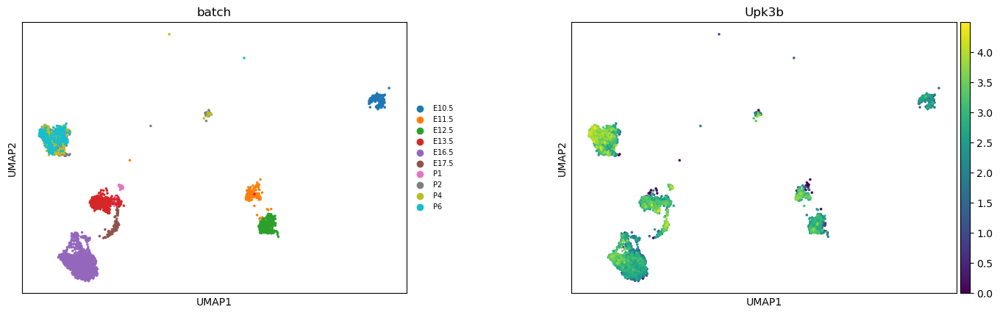

In [11]:
# We can see biological variance is driven predominantly by batch as this point, rather than bona fide biological difference
sc.pl.umap(
    epi,
    color=["batch", "Upk3b"],
    legend_fontweight='normal', legend_fontsize=7, wspace=0.3
)

In [12]:
# Number of epicardial cells per batch/developmental stage
epi.obs["batch"].value_counts()

E16.5    1790
E13.5     628
E12.5     475
P2        345
P4        332
P6        287
E11.5     270
E10.5     247
E17.5     166
P1        132
Name: batch, dtype: int64

In [4]:
batch_key = "batch"
label_key = "celltypist_cell_label_PRJNA795900"

In [40]:
# Number of total cells per batch/developmental stage
adatas.obs[batch_key].value_counts()

E12.5    10344
E10.5    10000
P6        9181
P2        8758
E13.5     8521
P4        6847
E17.5     6677
P1        6000
E11.5     3344
E16.5     2448
Name: batch, dtype: int64

In [23]:
# Many integration methods used in this workflow performs better with a limited set of highly informative genes (highly variable genes- HVG). 
# We will filter the dataset down to HVGs, but the original data to the .raw layer so we can recover that data later. 
adatas.X = adatas.layers['soupX_counts'].copy()
adatas.raw = adatas
adata_hvg = adatas[:, adatas.var["highly_variable"]]
adata_hvg

View of AnnData object with n_obs × n_vars = 72120 × 6000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates', 'scDblFinder_score', 'scDblFinder_class', 'batch', 'n_genes', 'size_factors', 'leiden_res0_25', 'celltypist_cell_label_PRJNA795900', 'celltypist_conf_score_PRJNA795900'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'scDblFinder_class_colors', 'batch_colors', 'leiden', 'celltypist_cell_label_PRJNA795900_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'log1p_norm', 'scran_normalization', 'soupX_counts'
    obsp: 'distance

In [25]:
# Check that the original dataset is properly saved to the .raw layer
adata_hvg.raw.to_adata()

AnnData object with n_obs × n_vars = 72120 × 22400
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates', 'scDblFinder_score', 'scDblFinder_class', 'batch', 'n_genes', 'size_factors', 'leiden_res0_25', 'celltypist_cell_label_PRJNA795900', 'celltypist_conf_score_PRJNA795900'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'scDblFinder_class_colors', 'batch_colors', 'leiden', 'celltypist_cell_label_PRJNA795900_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

## Perform single-cell batch correction and integration. This section is inspired by scib-metrics

In [3]:
adata.obsm["Unintegrated"] = adata.obsm["X_pca"]

In [6]:
# Perform single-cell integration using scVI, with two hidden layers for encoder/decoders and a 30-dimension latent space
import scvi

scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="batch")
vae = scvi.model.SCVI(adata, gene_likelihood="nb", n_layers=2, n_latent=30)
vae.train()
adata.obsm["scVI"] = vae.get_latent_representation()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/mnt/sdb/qdang/micromamba/envs/scib_metrics/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=35` in the `DataLoader` to improve performance.


Epoch 111/111: 100%|████████████| 111/111 [18:46<00:00, 10.17s/it, v_num=1, train_loss_step=2.93e+3, train_loss_epoch=3.04e+3]

`Trainer.fit` stopped: `max_epochs=111` reached.


Epoch 111/111: 100%|████████████| 111/111 [18:46<00:00, 10.15s/it, v_num=1, train_loss_step=2.93e+3, train_loss_epoch=3.04e+3]


In [8]:
# Perform scANVi-based integration using the model trained by scVI, adding cell type annotation
lvae = scvi.model.SCANVI.from_scvi_model(
    vae,
    adata=adata,
    labels_key="celltypist_cell_label_PRJNA795900",
    unlabeled_category="Unknown",
)
lvae.train(max_epochs=20, n_samples_per_label=100)
adata.obsm["scANVI"] = lvae.get_latent_representation()

INFO     Training for 20 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/mnt/sdb/qdang/micromamba/envs/scib_metrics/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=35` in the `DataLoader` to improve performance.


Epoch 20/20: 100%|█████████████████| 20/20 [07:50<00:00, 23.15s/it, v_num=1, train_loss_step=2.6e+3, train_loss_epoch=3.03e+3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|█████████████████| 20/20 [07:50<00:00, 23.51s/it, v_num=1, train_loss_step=2.6e+3, train_loss_epoch=3.03e+3]


In [15]:
# Scanorama seems to work better with log normalisation: https://www.nature.com/articles/s41592-021-01336-8
adata.X = adata.layers['log1p_norm'].copy()
# List of adata per batch
batch_cats = adata.obs['batch'].unique()
adata_list = [adata[adata.obs['batch'] == b].copy() for b in batch_cats]
scanorama.integrate_scanpy(adata_list)

adata.obsm["Scanorama"] = np.zeros((adata.shape[0], adata_list[0].obsm["X_scanorama"].shape[1]))
for i, b in enumerate(batch_cats):
    adata.obsm["Scanorama"][adata.obs['batch'] == b] = adata_list[i].obsm["X_scanorama"]

Found 6000 genes among all datasets
[[0.00000000e+00 5.43959330e-01 8.90371230e-02 8.71963385e-02
  4.08496732e-04 7.03908941e-03 4.00000000e-03 1.66000000e-02
  2.62888856e-03 6.00000000e-04]
 [0.00000000e+00 0.00000000e+00 6.91387560e-01 2.67045455e-01
  4.49346405e-02 3.40909091e-02 4.78468900e-03 1.22607656e-02
  3.58851675e-03 1.79425837e-03]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 3.90212416e-01
  2.81045752e-01 7.00913584e-02 3.97331787e-02 3.85932861e-02
  1.10997517e-02 5.99381284e-03]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  3.17401961e-01 6.19290100e-01 1.27500000e-01 7.89813402e-02
  3.37988499e-02 2.13589954e-02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 2.79820261e-01 1.12336601e-01 1.01307190e-01
  5.14705882e-02 3.55392157e-02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 5.55339224e-01 2.48614647e-01
  1.53362288e-01 1.04987270e-01]
 [0.00000000e+00 0.000

In [16]:
# Integration with pyLIGER
batch_cats = adata.obs['batch'].unique()
adata_list = [adata[adata.obs['batch'] == b].copy() for b in batch_cats]
bdata = adata.copy()
# Pyliger normalizes by library size with a size factor of 1
# So here we give it the count data
bdata.X = bdata.layers["counts"]
# List of adata per batch
adata_list = [bdata[bdata.obs['batch'] == b].copy() for b in batch_cats]
for i, ad in enumerate(adata_list):
    ad.uns["sample_name"] = batch_cats[i]
    # Hack to make sure each method uses the same genes
    ad.uns["var_gene_idx"] = np.arange(bdata.n_vars)


liger_data = pyliger.create_liger(adata_list, remove_missing=False, make_sparse=False)
# Hack to make sure each method uses the same genes
liger_data.var_genes = bdata.var_names
pyliger.normalize(liger_data)
pyliger.scale_not_center(liger_data)
pyliger.optimize_ALS(liger_data, k=30)
pyliger.quantile_norm(liger_data)


adata.obsm["LIGER"] = np.zeros((adata.shape[0], liger_data.adata_list[0].obsm["H_norm"].shape[1]))
for i, b in enumerate(batch_cats):
    adata.obsm["LIGER"][adata.obs['batch'] == b] = liger_data.adata_list[i].obsm["H_norm"]

/mnt/sdb/qdang/micromamba/envs/scib_metrics/lib/python3.11/site-packages/pyliger/preprocessing/_scale.py:99: RuntimeWarning: divide by zero encountered in divide
100%|█████████████████████████████████████████████████████████████████████████████████████████| 30/30 [16:30<00:00, 33.03s/it]


In [20]:
# Integration using Harmony
adata.obsm["Harmony"] = harmonize(adata.obsm["X_pca"], adata.obs, batch_key="batch")

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
Reach convergence after 8 iteration(s).


In [3]:
# Run scGen integration through its implementation in the scib package
model = scib.integration.scgen(adata, batch='batch', cell_type='celltypist_cell_label_PRJNA795900')

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/lightning/fabric/plugins/environments/xla.py:18: DeprecationWarning: `ModuleAvailableCache` is a special case of `RequirementCache`. Please use `RequirementCache(module=...)` instead.
  from lightning.fabric.accelerators.tpu import _XLA_AVAILABLE, TPUAccelerator
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/lightning/fabric/__init__.py:36: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('lightning.fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  __import__("pkg_resources").declare_namespace(__name__)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/pkg_resources/__init__.py:2348: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('lightning')`.
Implementing implicit names

Epoch 2/100:   1%|▏                     | 1/100 [00:49<1:20:57, 49.06s/it, v_num=1, train_loss_step=361, train_loss_epoch=366]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 3/100:   2%|▍                     | 2/100 [01:36<1:18:24, 48.00s/it, v_num=1, train_loss_step=283, train_loss_epoch=323]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 4/100:   3%|▋                     | 3/100 [02:23<1:17:02, 47.65s/it, v_num=1, train_loss_step=355, train_loss_epoch=314]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 5/100:   4%|▉                     | 4/100 [03:10<1:15:57, 47.47s/it, v_num=1, train_loss_step=307, train_loss_epoch=309]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 6/100:   5%|█                     | 5/100 [03:57<1:14:59, 47.37s/it, v_num=1, train_loss_step=318, train_loss_epoch=306]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 7/100:   6%|█▎                    | 6/100 [04:45<1:14:08, 47.32s/it, v_num=1, train_loss_step=338, train_loss_epoch=304]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 8/100:   7%|█▌                    | 7/100 [05:32<1:13:18, 47.30s/it, v_num=1, train_loss_step=303, train_loss_epoch=302]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 9/100:   8%|█▊                    | 8/100 [06:19<1:12:29, 47.28s/it, v_num=1, train_loss_step=293, train_loss_epoch=301]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 10/100:   9%|█▉                   | 9/100 [07:06<1:11:39, 47.25s/it, v_num=1, train_loss_step=287, train_loss_epoch=300]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 11/100:  10%|██                  | 10/100 [07:54<1:10:51, 47.24s/it, v_num=1, train_loss_step=374, train_loss_epoch=299]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 12/100:  11%|██▏                 | 11/100 [08:41<1:10:02, 47.22s/it, v_num=1, train_loss_step=325, train_loss_epoch=298]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 13/100:  12%|██▍                 | 12/100 [09:28<1:09:09, 47.16s/it, v_num=1, train_loss_step=257, train_loss_epoch=297]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 14/100:  13%|██▌                 | 13/100 [10:15<1:08:23, 47.17s/it, v_num=1, train_loss_step=350, train_loss_epoch=297]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 15/100:  14%|██▊                 | 14/100 [11:02<1:07:37, 47.18s/it, v_num=1, train_loss_step=330, train_loss_epoch=296]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 16/100:  15%|███                 | 15/100 [11:49<1:06:51, 47.19s/it, v_num=1, train_loss_step=273, train_loss_epoch=296]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 17/100:  16%|███▏                | 16/100 [12:37<1:06:04, 47.20s/it, v_num=1, train_loss_step=355, train_loss_epoch=295]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 18/100:  17%|███▍                | 17/100 [13:24<1:05:17, 47.20s/it, v_num=1, train_loss_step=270, train_loss_epoch=295]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 19/100:  18%|███▌                | 18/100 [14:11<1:04:29, 47.18s/it, v_num=1, train_loss_step=318, train_loss_epoch=295]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 20/100:  19%|███▊                | 19/100 [14:58<1:03:41, 47.17s/it, v_num=1, train_loss_step=295, train_loss_epoch=294]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 21/100:  20%|████                | 20/100 [15:45<1:02:52, 47.16s/it, v_num=1, train_loss_step=342, train_loss_epoch=294]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 22/100:  21%|████▏               | 21/100 [16:32<1:02:06, 47.17s/it, v_num=1, train_loss_step=257, train_loss_epoch=294]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 23/100:  22%|████▍               | 22/100 [17:20<1:01:17, 47.15s/it, v_num=1, train_loss_step=289, train_loss_epoch=294]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 24/100:  23%|████▌               | 23/100 [18:07<1:00:31, 47.16s/it, v_num=1, train_loss_step=317, train_loss_epoch=293]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 25/100:  24%|█████▎                | 24/100 [18:54<59:46, 47.19s/it, v_num=1, train_loss_step=359, train_loss_epoch=293]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 26/100:  25%|█████▌                | 25/100 [19:41<58:58, 47.18s/it, v_num=1, train_loss_step=263, train_loss_epoch=293]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 26/100:  26%|█████▋                | 26/100 [20:28<58:17, 47.26s/it, v_num=1, train_loss_step=375, train_loss_epoch=293]

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)



Monitored metric elbo_validation did not improve in the last 25 records. Best score: 1727.234. Signaling Trainer to stop.


/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/scgen/_scgen.py:268: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  all_shared_ann = AnnData.concatenate(


INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [4]:
# Copy over the batch-corrected latent embedding to the anndata object
adata.layers['scGen_corrected'] = model.X.copy()

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


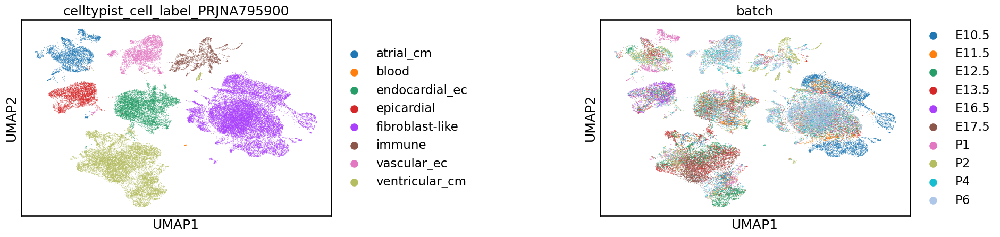

In [7]:
# Set the .X layer to scGen-corrected counts, then perform PCA and UMAP
adata.X = adata.layers['scGen_corrected'].copy()
sc.pp.pca(adata, svd_solver="arpack")
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['celltypist_cell_label_PRJNA795900', 'batch'], wspace=0.7)

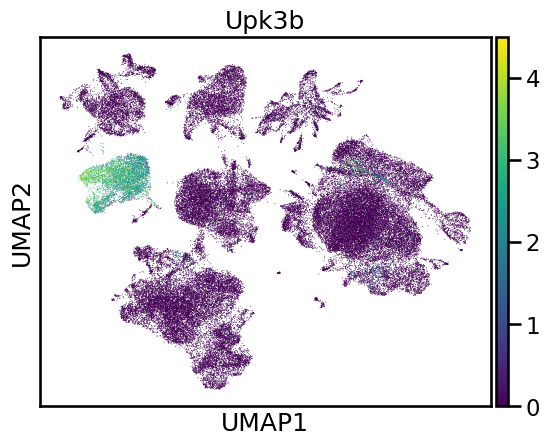

In [9]:
# Check epicardial cell integration
sc.pl.umap(adata, color=['Upk3b'], layer='log1p_norm')

/mnt/sdb/qdang/micromamba/envs/scib/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


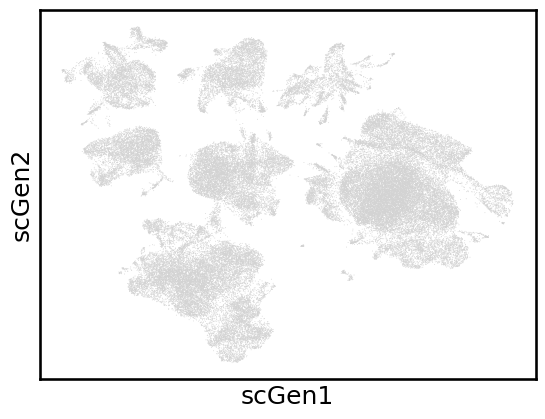

In [11]:
# Save the scGen embedding
adata.obsm['scGen'] = adata.obsm['X_umap'].copy()
sc.pl.embedding(adata, basis='scGen')

In [2]:
# Perofrm BBKNN integration. Define the number of neighbors per batch
neighbors_within_batch = 25 if adata.n_obs > 100000 else 3
neighbors_within_batch

3

In [4]:
# We use log normalised counts here
adata.X = adata.layers["log1p_norm"].copy()
sc.pp.pca(adata)

In [6]:
# Run BBKNN integration
bbknn.bbknn(
    adata, batch_key=batch_key, neighbors_within_batch=neighbors_within_batch
)
adata

AnnData object with n_obs × n_vars = 72120 × 6000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates', 'scDblFinder_score', 'scDblFinder_class', 'batch', 'n_genes', 'size_factors', 'leiden_res0_25', 'celltypist_cell_label_PRJNA795900', 'celltypist_conf_score_PRJNA795900', '_scvi_batch', '_scvi_labels'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'celltypist_cell_label_PRJNA795900_colors', 'hvg', 'leiden', 'neighbors', 'pca', 'scDblFinder_class_colors', 'umap'
    obsm: 'Harmony', 'LIGER', 'Scanorama', 'Unintegrated', 'X_pca', 'X_umap', 

/mnt/sdb/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/sdb/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


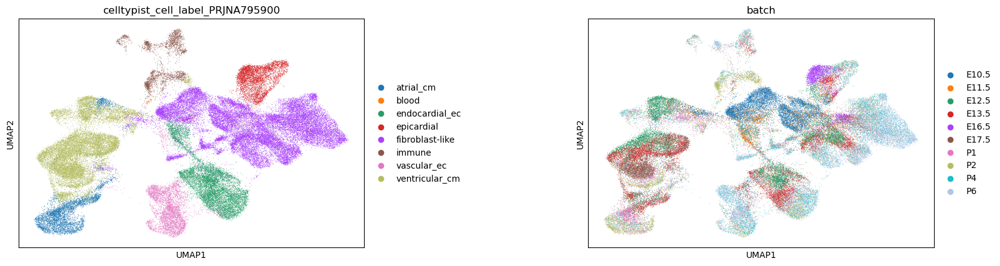

In [7]:
sc.tl.umap(adata)
sc.pl.umap(adata, color=[label_key, batch_key], wspace=0.5)

/mnt/sdb/qdang/micromamba/envs/bioinfo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


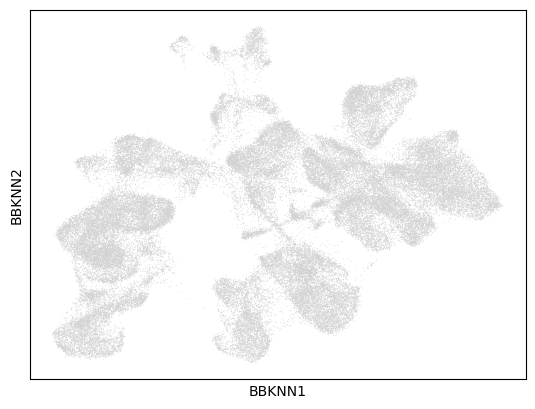

In [9]:
# Save the BBKNN embedding
adata.obsm['BBKNN'] = adata.obsm['X_umap'].copy()
sc.pl.embedding(adata, basis='BBKNN')

# Do the benchmarking of integration methods

In [6]:
# We need to define the batch key and lebl key in obs. 
# Also define the integration embedding
bm = Benchmarker(
    adata,
    batch_key="batch",
    label_key="celltypist_cell_label_PRJNA795900",
    embedding_obsm_keys=["Unintegrated", "Scanorama", "LIGER", "Harmony", "scVI","scANVI","BBKNN", 'scGen'],
    n_jobs=30, # using 30 threads
)
bm.benchmark()

Metrics:   0%|                                                      | 0/10 [00:00<?, ?it/s, Bio conservation: isolated_labels]2024-10-09 07:15:38.567785: W external/xla/xla/service/gpu/nvptx_compiler.cc:930] The NVIDIA driver's CUDA version is 12.2 which is older than the PTX compiler version 12.6.77. Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.

Metrics:  30%|███████████████▌                                    | 3/10 [00:46<01:38, 14.01s/it, Bio conservation: clisi_knn]2024-10-09 07:16:16.778768: E external/xla/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 1s:

  %convert.4 = f32[] convert(s32[] %constant.4), metadata={op_name="jit(_get_neighbor_probability)/jit(main)/while/body/jit(_Hbeta)/jit(_where)/convert_element_type" source_file="/tmp/ipykernel_2316685/2768

/mnt/sdb/qdang/micromamba/envs/scib_metrics/lib/python3.11/site-packages/scib_metrics/benchmark/_core.py:268: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Aggregate score' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[_METRIC_TYPE, per_class_score.columns] = _AGGREGATE_SCORE
/mnt/sdb/qdang/micromamba/envs/scib_metrics/lib/python3.11/site-packages/scib_metrics/benchmark/_core.py:268: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Aggregate score' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[_METRIC_TYPE, per_class_score.columns] = _AGGREGATE_SCORE
/mnt/sdb/qdang/micromamba/envs/scib_metrics/lib/python3.11/site-packages/scib_metrics/benchmark/_core.py:268: FutureWarning: Setting an item of incompatible dtype is deprecated

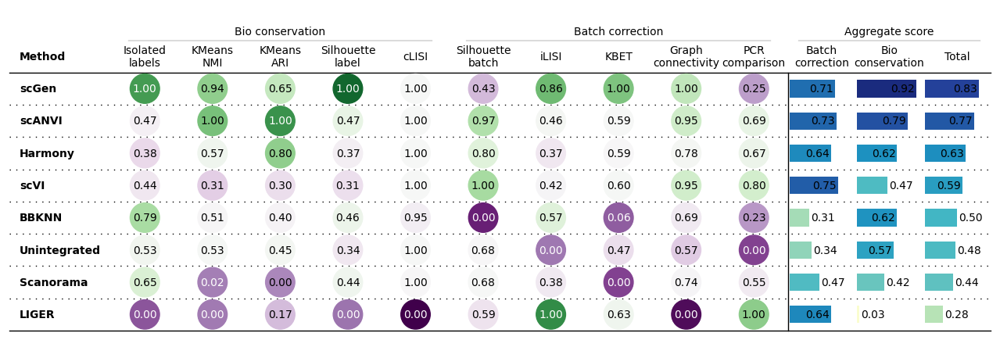

In [7]:
# We can see that scGen is the best-performing method. It performs particularly well in conserving meaningful biological variance. 
# The mix-max scale is used here to better distuiguish methods, whose scores may be very close together. 
bm.plot_results_table()

In [10]:
# The integration results in the form of a table
from rich import print

df = bm.get_results(min_max_scale=False)
df.transpose()

Embedding,Unintegrated,Scanorama,LIGER,Harmony,scVI,scANVI,BBKNN,scGen,Metric Type
Isolated labels,0.865293,0.896185,0.716805,0.82239,0.838847,0.848338,0.936906,0.994375,Bio conservation
KMeans NMI,0.634303,0.473903,0.468505,0.645658,0.566688,0.781395,0.62779,0.763404,Bio conservation
KMeans ARI,0.450853,0.270657,0.34022,0.594099,0.393687,0.674811,0.431494,0.533341,Bio conservation
Silhouette label,0.557325,0.579582,0.482528,0.56354,0.550253,0.586301,0.583508,0.703775,Bio conservation
cLISI,1.0,1.0,0.994937,1.0,1.0,1.0,0.99974,1.0,Bio conservation
Silhouette batch,0.857229,0.857858,0.838151,0.884708,0.927684,0.920077,0.707363,0.802888,Batch correction
iLISI,0.003734,0.105952,0.27309,0.103791,0.117849,0.127462,0.156707,0.235248,Batch correction
KBET,0.135427,0.033674,0.169174,0.160776,0.162393,0.160988,0.047005,0.248694,Batch correction
Graph connectivity,0.899646,0.935648,0.782688,0.942829,0.978064,0.978485,0.925126,0.988325,Batch correction
PCR comparison,0.0,0.504908,0.914212,0.612647,0.727571,0.634234,0.213042,0.231301,Batch correction


In [ ]:
# Use scGen corrected counts and embedding for subsequent analyses
adata.X = adata.layers['scGen_corrected'].copy()
sc.pp.pca(adata, svd_solver="arpack")
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [9]:
label_key = 'celltypist_cell_label_PRJNA795900'
batch_key = 'batch'

/mnt/sdb/qdang/micromamba/envs/scib_metrics/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/mnt/sdb/qdang/micromamba/envs/scib_metrics/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/sdb/qdang/micromamba/envs/scib_metrics/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vec

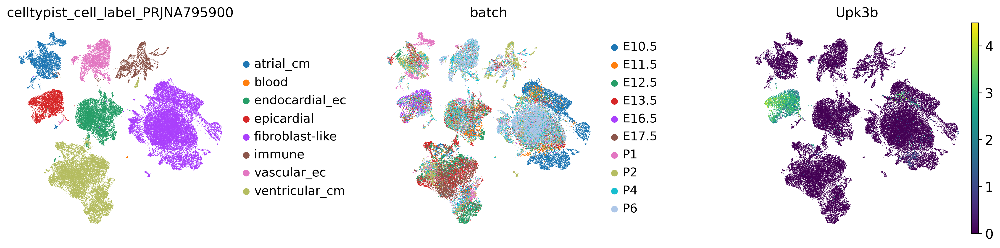

In [32]:
sc.pl.umap(adata, color=[label_key, batch_key,'Upk3b'], layer='log1p_norm', wspace=0.5)

In [35]:
# Renove doublets
adata2 = adata[-adata.obs['scDblFinder_class'].isin(['doublet'])]
adata2

View of AnnData object with n_obs × n_vars = 65660 × 6000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates', 'scDblFinder_score', 'scDblFinder_class', 'batch', 'n_genes', 'size_factors', 'leiden_res0_25', 'celltypist_cell_label_PRJNA795900', 'celltypist_conf_score_PRJNA795900', '_scvi_batch', '_scvi_labels'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'celltypist_cell_label_PRJNA795900_colors', 'hvg', 'leiden', 'neighbors', 'pca', 'scDblFinder_class_colors', 'umap', 'leiden_res0_25_colors'
    obsm: 'BBKNN', 'Harmony', 'LIGER', 'Scano

In [36]:
# Subset the epicardium cluster
adata_epi = adata2[adata2.obs['leiden_res0_25'].isin(['5'])]
adata_epi

View of AnnData object with n_obs × n_vars = 4374 × 6000
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'replicates', 'scDblFinder_score', 'scDblFinder_class', 'batch', 'n_genes', 'size_factors', 'leiden_res0_25', 'celltypist_cell_label_PRJNA795900', 'celltypist_conf_score_PRJNA795900', '_scvi_batch', '_scvi_labels'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'celltypist_cell_label_PRJNA795900_colors', 'hvg', 'leiden', 'neighbors', 'pca', 'scDblFinder_class_colors', 'umap', 'leiden_res0_25_colors'
    obsm: 'BBKNN', 'Harmony', 'LIGER', 'Scanor

In [38]:
adata_epi.obs['batch'].value_counts()

batch
E16.5    1722
E13.5     605
E12.5     436
P2        306
P4        302
P6        257
E11.5     246
E10.5     209
E17.5     164
P1        127
Name: count, dtype: int64